In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mannwhitneyu
from ggner_3d import plotting
plotting.update_rcparams()

flank = 300_000

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

COLORS = ['#465775', '#A63446', '#F5B841', '#9DBBAE']
data_dir = '/home/carlos/Clone/ggner-3d/data/1_0_1'

smds = {}
ctcf_signal_dict = {}
insulation_efficiency_dict = {}

data_dirs = {
    'pol2': f'{data_dir}/ws_100000/grid_search_data_pol2.csv',
    'atac_signal': f'{data_dir}/ws_100000/grid_search_data_atac_signal.csv',
    'h3k4me3_signal': f'{data_dir}/ws_100000/grid_search_data_h3k4me3_signal.csv',
    'h3k27ac_signal': f'{data_dir}/ws_100000/grid_search_data_h3k27ac_signal.csv',
    'h3k4me1_signal': f'{data_dir}/ws_100000/grid_search_data_h3k4me1_signal.csv',
}

LABELMAPPING = {
    'pol2': f'Pol2',
    'atac_signal': f'ATAC',
    'h3k4me3_signal': f'H3K4me3',
    'h3k4me1_signal': f'H3K4me1',
    'h3k27ac_signal': f'H3K27ac',
}
ORDER = ['ATAC', 'H3K4me3', 'H3K4me1', 'H3K27ac', 'Pol2']
# ORDER = ['ATAC', 'H3K4me3', 'H3K4me1', 'H3K27ac']


In [2]:
def split_df(
        df: pd.DataFrame,
):
    group_labels = ['Focal', 'Matched Control', 'Unmatched Control']
    df_dict = {label: df[df['group_label'] == label] for label in group_labels}
    # merge matched and unmatched control groups as pool
    df_dict['Control Pool'] = pd.concat([df_dict['Matched Control'], df_dict['Unmatched Control']])
    # print n of samples per group
    for label in df_dict:
        print(f"{label}: {len(df_dict[label])} samples")

    return df_dict

def _smd(
        mean_1: float,
        mean_2: float,
        sd_1: float,
        sd_2: float,
):
    pooled_sd = ((sd_1 ** 2 + sd_2 ** 2) / 2) ** 0.5
    smd = (mean_1 - mean_2) / pooled_sd
    return abs(smd)

def calculate_smd(
        df_dict: dict,
        contrast_labels: list,
        contrast_key: str,
):
    smd_results = {}
    for label in contrast_labels:
        mean_1 = df_dict['Focal'][contrast_key].mean()
        mean_2 = df_dict[label][contrast_key].mean()
        sd_1 = df_dict['Focal'][contrast_key].std()
        sd_2 = df_dict[label][contrast_key].std()
        smd = _smd(mean_1, mean_2, sd_1, sd_2)
        smd_results[label] = smd
    return smd_results

def plot_distribution(
        df_dict: dict,
        contrast_key: str,
        x_label: str = None,
        y_label: str = None,
        ax: any = None,
):
    
    plot_df = pd.concat([df.assign(source=label) for label, df in df_dict.items()])
    s = sns.histplot(
        data=plot_df,
        x=contrast_key,
        hue='source',
        element='step',
        stat='density',
        common_norm=False,
        fill=False,
        palette=COLORS,
        ax=ax if ax else None,
    )
    s.set_xlabel(x_label if x_label else contrast_key)
    s.set_ylabel(y_label if y_label else 'Density')
    # remove legend title
    s.legend_.set_title(None)
    # set legend margin to 0
    s.legend_.get_frame().set_linewidth(0.0)
    return s

def p_to_asterisks(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return 'ns'

### plot covariates

Contrast key: pol2
Focal: 652 samples
Matched Control: 652 samples
Unmatched Control: 23766 samples
Control Pool: 24418 samples
####
Axes(0.125,0.653529;0.352273x0.226471)
Contrast key: atac_signal
Focal: 1954 samples
Matched Control: 1954 samples
Unmatched Control: 17580 samples
Control Pool: 19534 samples
####
Axes(0.547727,0.653529;0.352273x0.226471)
Contrast key: h3k4me3_signal
Focal: 1303 samples
Matched Control: 1303 samples
Unmatched Control: 19859 samples
Control Pool: 21162 samples
####
Axes(0.125,0.381765;0.352273x0.226471)


/tmp/ipykernel_58054/2220166453.py:48: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  s = sns.histplot(
/tmp/ipykernel_58054/2220166453.py:48: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  s = sns.histplot(
/tmp/ipykernel_58054/2220166453.py:48: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  s = sns.histplot(


Contrast key: h3k27ac_signal
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 20836 samples
Control Pool: 21162 samples
####
Axes(0.547727,0.381765;0.352273x0.226471)
Contrast key: h3k4me1_signal
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 22464 samples
Control Pool: 22790 samples
####
Axes(0.125,0.11;0.352273x0.226471)


/tmp/ipykernel_58054/2220166453.py:48: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  s = sns.histplot(
/tmp/ipykernel_58054/2220166453.py:48: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  s = sns.histplot(


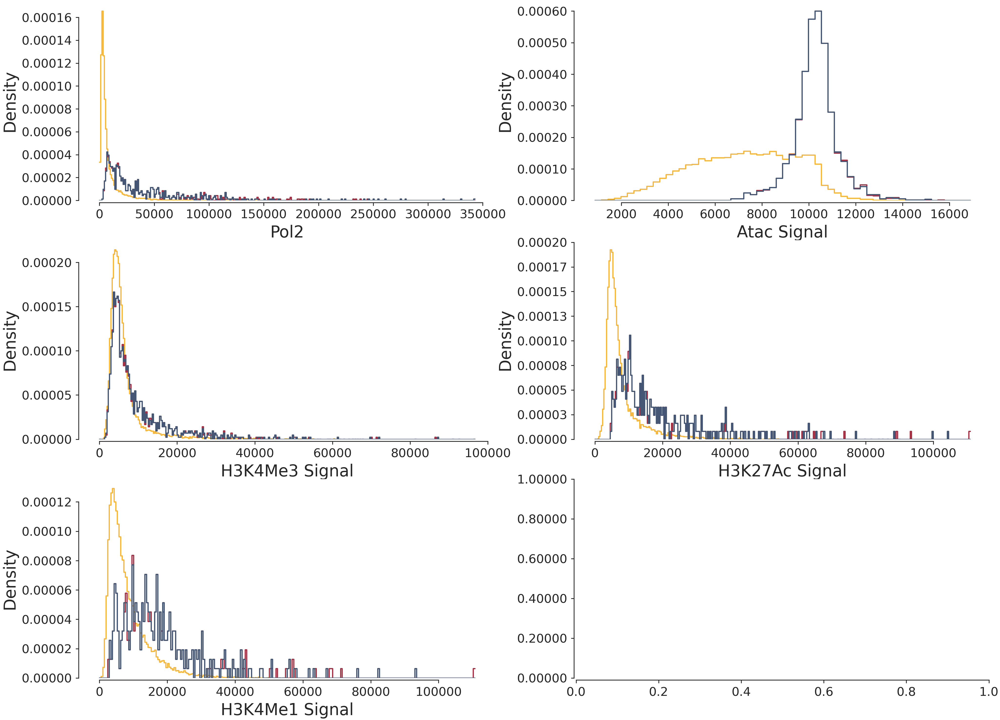

In [3]:
def _wrapper(df_path, _key, density_plot_xlabel, ax=None):
    data_df = pd.read_csv(df_path)
    print(f'Contrast key: {_key}')
    split_dfs = split_df(data_df)
    print('####')

    ctcf_signal_dict[_key] = {
        group: split_dfs[group]['ctcf_signal'].values
        for group in ['Focal', 'Matched Control']
    }

    insulation_efficiency_dict[_key] = {
        group: split_dfs[group]['ins_eff'].values
        for group in ['Focal', 'Matched Control']
    }

    smds[_key] = calculate_smd(
        split_dfs,
        contrast_labels=['Matched Control', 'Unmatched Control', 'Control Pool'],
        contrast_key=_key,
    )

    print(ax)
    density_plot = plot_distribution(
        {k:v for k, v in split_dfs.items() if k in ['Focal', 'Matched Control', 'Unmatched Control']},
        contrast_key=_key,
        x_label=density_plot_xlabel,
        y_label='Density',
        ax=ax,
    )

fig, axs = plt.subplots(3, 2, figsize=(16, 12))

for i, ( _key, df_path) in enumerate(data_dirs.items()):
    _wrapper(df_path, _key, density_plot_xlabel=_key.replace('_', ' ').title(), ax=axs[i // 2, i % 2])

for ax in axs.flatten():
    plotting.despine(ax=ax)
    # make x, y labels bigger
    ax.set_ylabel(ax.get_ylabel(), fontsize=16)
    ax.set_xlabel(ax.get_xlabel(), fontsize=16)
    # remove legends
    legend = ax.get_legend()
    if legend is not None:
        legend.remove()
    # make x and y ticks bigger
    ax.tick_params(axis='both', which='major', labelsize=12)

    # make y ticks 2 digits after comma
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.5f}'))

fig.savefig('/home/carlos/Clone/ggner-3d/figs/fig4/fig4_covariate_distributions.png', dpi=300)
fig.savefig('/home/carlos/Clone/ggner-3d/figs/fig4/fig4_covariate_distributions.svg', dpi=300)

### lollipop

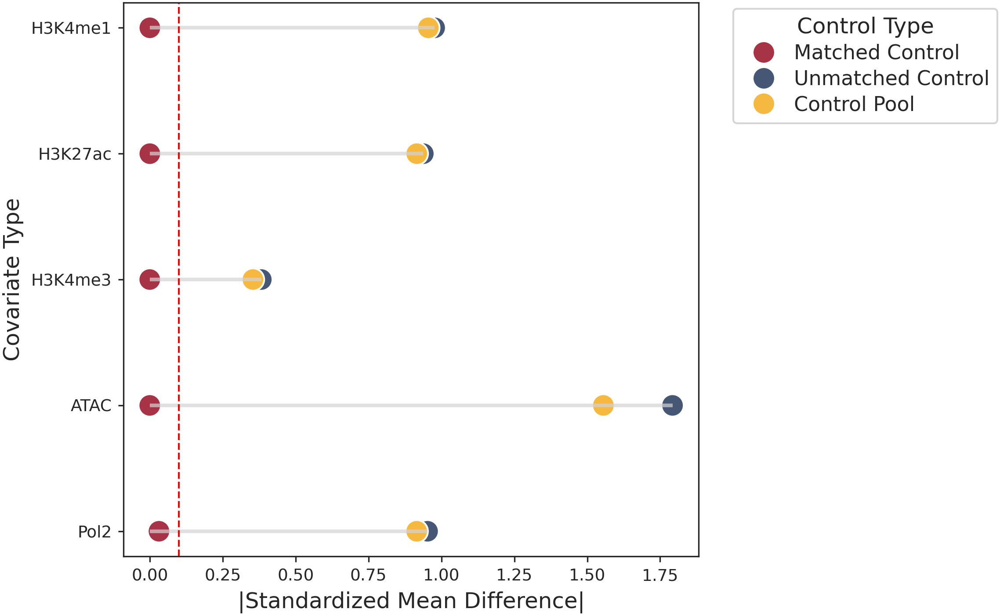

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert dict to dataframe
df = pd.DataFrame(smds).T
df_long = df.reset_index().melt(id_vars='index',
                                var_name='Control Type',
                                value_name='SMD')
df_long.rename(columns={'index': 'Feature'}, inplace=True)

name_map = {
    "atac_signal": "ATAC",
    "h3k4me3_signal": "H3K4me3",
    "h3k4me1_signal": "H3K4me1",
    "h3k27ac_signal": "H3K27ac",
    "pol2": "Pol2",
}

df_long["Feature"] = df_long["Feature"].map(name_map)

# Custom palette in correct order
palette = {
    'Matched Control': '#A63446',
    'Unmatched Control': '#465775',
    'Control Pool': '#F5B841'
}

fig, ax = plt.subplots(1, 1, figsize=(8, 5))
sns.set(style="whitegrid")

# ---- Draw horizontal lines per feature ----
features = df_long["Feature"].unique()

for i, feature in enumerate(features):
    subset = df_long[df_long["Feature"] == feature]
    xmax = subset["SMD"].max()
    plt.hlines(y=i, xmin=0, xmax=xmax, color="lightgray", lw=2, alpha=0.7)

# ---- Draw colored dots ----
s = sns.scatterplot(
    data=df_long,
    x="SMD",
    y=df_long["Feature"].apply(lambda f: list(features).index(f)),
    hue="Control Type",
    palette=palette,
    s=150,
    ax=ax
)

# Fix y-tick labels
plt.yticks(
    ticks=range(len(features)),
    labels=features
)

plt.xlabel("|Standardized Mean Difference|")
plt.ylabel("Covariate Type")

plt.legend(title="Control Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

# add vline at 0.1
plt.axvline(x=0.1, color='red', linestyle='--', lw=1)

fig.savefig(f'/home/carlos/Clone/ggner-3d/figs/fig4/smd_lollipop_plot.svg', format='svg', dpi=300)

### ctcf levels and ins efficiency

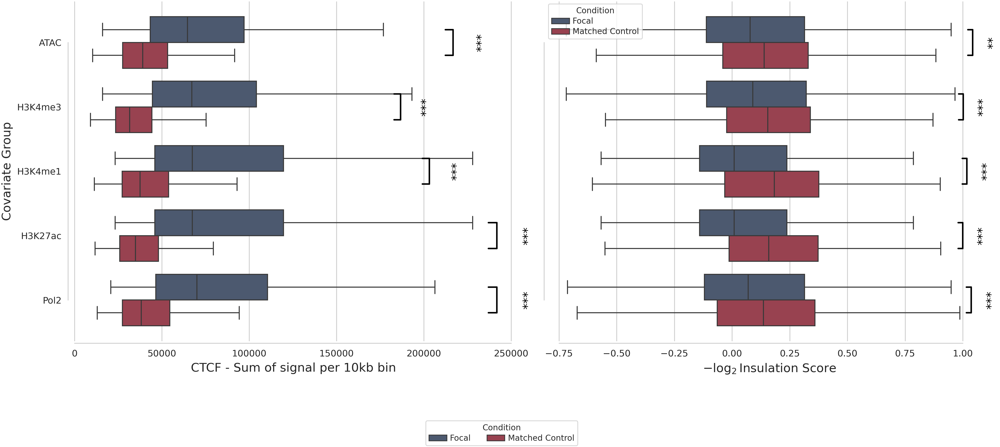

In [5]:
from ggner_3d import plotting
plotting.update_rcparams()

# --- Function to Prepare DataFrame ---
def prepare_df(data_dict):
    rows = []
    for covariate_type in data_dict.keys():
        for group in ['Focal', 'Matched Control']:
            signals = data_dict[covariate_type][group]
            for signal in signals:
                rows.append({
                    'Group': covariate_type,
                    'Condition': group,
                    'Signal': signal
                })
    df = pd.DataFrame(rows)
    

    df['Group'] = df['Group'].replace(LABELMAPPING)
    return df

# --- Function to Draw Boxplot and Annotate Statistics ---
def plot_and_annotate(ax, df, x_label, palette):
    sns.boxplot(data=df, y='Group', x='Signal', hue='Condition', 
                orient='h', showfliers=False, palette=palette, ax=ax,
                # Ensure the order of groups is the same for shared Y-axis
                order=ORDER)
    
    # Statistical Annotation
    groups = df['Group'].unique()
    hue_order = ['Focal', 'Matched Control']
    y_mapping = {g: i for i, g in enumerate(groups)}
    
    for group in groups:
        focal_data = df[(df['Group'] == group) & (df['Condition'] == 'Focal')]['Signal']
        control_data = df[(df['Group'] == group) & (df['Condition'] == 'Matched Control')]['Signal']
        
        # Perform Test
        stat, pval = mannwhitneyu(focal_data, control_data, alternative='two-sided')

        # Convert to asterisks
        p_text = p_to_asterisks(pval)
        
        # Determine position
        y = y_mapping[group]
        
        # Compute visual max (whisker)
        max_val = 0
        for cond in hue_order:
            d = df[(df['Group'] == group) & (df['Condition'] == cond)]['Signal']
            if d.empty: continue
            q1 = d.quantile(0.25)
            q3 = d.quantile(0.75)
            iqr = q3 - q1
            whisker = q3 + 1.5 * iqr
            visual_max = min(d.max(), whisker)
            if visual_max > max_val:
                max_val = visual_max
        
        # Draw bracket
        x_line = max_val * 1.05 # Adjust multiplier as needed for aesthetic spacing
        y1 = y - 0.2
        y2 = y + 0.2

        ax.plot([x_line, x_line], [y1, y2], color='black', lw=1.5, clip_on=False)
        ax.plot([x_line * 0.98, x_line], [y1, y1], color='black', lw=1.5, clip_on=False)
        ax.plot([x_line * 0.98, x_line], [y2, y2], color='black', lw=1.5, clip_on=False)

        # Asterisk label
        ax.text(x_line * 1.06, y, p_text, va='center', ha='left', color='black', fontsize=12, rotation=90, clip_on=False)
    
    ax.set_xlabel(x_label)
    # Remove the default Y-axis label/ticks which will be set on the shared Y-axis
    ax.set_ylabel('')


# --- Execution of the Combined Plot ---
df_ctcf = prepare_df(ctcf_signal_dict)
df_insulation = prepare_df(insulation_efficiency_dict)

sns.set_style("whitegrid")
palette = {'Focal': COLORS[0], 'Matched Control': COLORS[1]}

# 1. Setup the 1x2 figure
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True) 

# 2. Plot CTCF Signal
plot_and_annotate(axes[0], df_ctcf, 
                  x_label='CTCF - Sum of signal per 10kb bin', 
                  palette=palette)
# axes[0].set_title('CTCF Signal', fontsize=14)

# 3. Plot Insulation Efficiency
plot_and_annotate(axes[1], df_insulation, 
                  x_label=r'$-\log_{2}\text{Insulation Score}$', 
                  palette=palette)
# axes[1].set_title('Insulation Efficiency', fontsize=14)

# 4. Set shared Y-axis label/ticks on the left subplot (axes[0])
axes[0].set_ylabel('Covariate Group', fontsize=12)

# 5. Extract and transfer Legend from one subplot to the figure
handles, labels = axes[0].get_legend_handles_labels()
# Remove existing legends
axes[0].legend_.remove()
# Add one master legend outside the plots
fig.legend(handles, labels, title='Condition', loc='lower center', 
           ncol=2, bbox_to_anchor=(0.5, -0.05), frameon=True)

# Adjust layout to prevent overlap, especially considering the external legend
plt.tight_layout(rect=[0, 0.1, 1, 1]) # Make space for the legend at the bottom

for ax in axes:
    plotting.despine(ax)

fig.savefig(f'/home/carlos/Clone/ggner-3d/figs/fig4/ctcf_insulation_boxplots.svg', format='svg', dpi=300)

### raincloud version

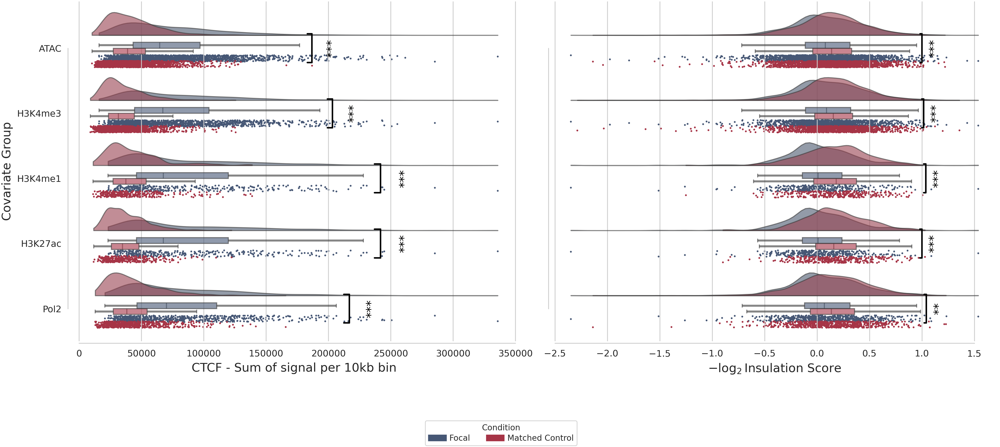

In [6]:
# pip install ptitprince
import ptitprince as pt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

from ggner_3d import plotting
plotting.update_rcparams()

def prepare_df(data_dict):
    rows = []
    for covariate_type in data_dict.keys():
        for cond in ['Focal', 'Matched Control']:
            for signal in data_dict[covariate_type][cond]:
                rows.append({'Group': covariate_type, 'Condition': cond, 'Signal': signal})
    df = pd.DataFrame(rows)
    df['Group'] = df['Group'].replace(LABELMAPPING)

    # ensure numeric for ptitprince KDE
    df['Signal'] = pd.to_numeric(df['Signal'], errors='coerce')
    df = df.dropna(subset=['Signal'])
    return df

def _visual_max_whisker(d: pd.Series) -> float:
    if d.empty:
        return 0.0
    q1 = d.quantile(0.25)
    q3 = d.quantile(0.75)
    iqr = q3 - q1
    whisker = q3 + 1.5 * iqr
    return float(min(d.max(), whisker))

def raincloud_and_annotate(ax, df, x_label, palette):
    hue_order = ['Focal', 'Matched Control']

    # IMPORTANT: for orient='h' in ptitprince -> x MUST be categorical, y MUST be numeric
    pt.RainCloud(
        data=df,
        x='Group',          # categorical
        y='Signal',         # numeric
        hue='Condition',
        hue_order=hue_order,
        order=ORDER,
        orient='h',
        dodge=True,
        palette=palette,
        width_viol=0.70,
        width_box=0.18,
        move=0.20,
        point_size=1.8,
        linewidth=1,
        alpha=0.6,
        ax=ax,
        box_showfliers=False
    )

    # ---- Stats + bracket annotations (y is categorical index) ----
    y_mapping = {g: i for i, g in enumerate(ORDER)}

    for group in ORDER:
        focal = df[(df['Group'] == group) & (df['Condition'] == 'Focal')]['Signal']
        ctrl  = df[(df['Group'] == group) & (df['Condition'] == 'Matched Control')]['Signal']
        if focal.empty or ctrl.empty:
            continue

        stat, pval = mannwhitneyu(focal, ctrl, alternative='two-sided')
        p_text = p_to_asterisks(pval)

        y = y_mapping[group]

        max_val = max(_visual_max_whisker(focal), _visual_max_whisker(ctrl))
        if max_val <= 0:
            max_val = max(float(focal.max()), float(ctrl.max()))

        x_line = max_val * 1.05
        y1, y2 = y - 0.22, y + 0.22

        ax.plot([x_line, x_line], [y1, y2], color='black', lw=1.5, clip_on=False)
        ax.plot([x_line * 0.98, x_line], [y1, y1], color='black', lw=1.5, clip_on=False)
        ax.plot([x_line * 0.98, x_line], [y2, y2], color='black', lw=1.5, clip_on=False)

        ax.text(
            x_line * 1.06, y, p_text,
            va='center', ha='left',
            fontsize=12, rotation=90,
            color='black', clip_on=False
        )

    ax.set_xlabel(x_label)
    ax.set_ylabel('')

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

# --- Execution ---
df_ctcf = prepare_df(ctcf_signal_dict)
df_insulation = prepare_df(insulation_efficiency_dict)

sns.set_style("whitegrid")
palette = {'Focal': COLORS[0], 'Matched Control': COLORS[1]}

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

raincloud_and_annotate(
    axes[0], df_ctcf,
    x_label='CTCF - Sum of signal per 10kb bin',
    palette=palette
)

raincloud_and_annotate(
    axes[1], df_insulation,
    x_label=r'$-\log_{2}\text{Insulation Score}$',
    palette=palette
)

axes[0].set_ylabel('Covariate Group', fontsize=12)

# one master legend
import matplotlib.patches as mpatches
handles = [mpatches.Patch(color=palette[h], label=h) for h in ['Focal', 'Matched Control']]
fig.legend(
    handles=handles,
    labels=['Focal', 'Matched Control'],
    title='Condition',
    loc='lower center',
    ncol=2,
    bbox_to_anchor=(0.5, -0.05),
    frameon=True
)

plt.tight_layout(rect=[0, 0.1, 1, 1])

for ax in axes:
    plotting.despine(ax)

fig.savefig(
    '/home/carlos/Clone/ggner-3d/figs/fig4/ctcf_insulation_raincloud.svg',
    format='svg',
    dpi=300
)

In [7]:
df_ctcf.groupby('Group')['Condition'].value_counts()

Group    Condition      
ATAC     Focal              1954
         Matched Control    1954
H3K27ac  Focal               326
         Matched Control     326
H3K4me1  Focal               326
         Matched Control     326
H3K4me3  Focal              1303
         Matched Control    1303
Pol2     Focal               652
         Matched Control     652
Name: count, dtype: int64

### insulation

In [8]:
from ggner_3d.boundaries import get_insulation_fixed

wt_nouv_boundaries = pd.read_csv('/home/carlos/Clone/ggner-3d/data/insulation/insulation_WTnoUV_10000bp.csv')

which_col = 'log2_insulation_score_100000'

def _ins_wrapper(df_path, which_col, flank):
    data_df = pd.read_csv(df_path)
    split_dfs = split_df(data_df)
    boundaries_focal = get_insulation_fixed(
        wt_nouv_boundaries, flank=flank, insul_column=which_col, resolution=10_000, coord_df=split_dfs['Focal'])
    boundaries_matched = get_insulation_fixed(
        wt_nouv_boundaries, flank=flank, insul_column=which_col, resolution=10_000, coord_df=split_dfs['Matched Control'])
    return boundaries_focal, boundaries_matched

_focal_ins = []
_matched_ins = []
for _key, df_path in data_dirs.items():
    focal, matched = _ins_wrapper(df_path, which_col=which_col, flank=flank)
    _focal_ins.append(focal)
    _matched_ins.append(matched)

Focal: 652 samples
Matched Control: 652 samples
Unmatched Control: 23766 samples
Control Pool: 24418 samples
Focal: 1954 samples
Matched Control: 1954 samples
Unmatched Control: 17580 samples
Control Pool: 19534 samples
Focal: 1303 samples
Matched Control: 1303 samples
Unmatched Control: 19859 samples
Control Pool: 21162 samples
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 20836 samples
Control Pool: 21162 samples
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 22464 samples
Control Pool: 22790 samples


In [9]:

import importlib
from ggner_3d import bbi_helpers
importlib.reload(bbi_helpers)
from ggner_3d.bbi_helpers import stackup_bw_dict


bwdict = {
    'pol2_wtnouv': ['/home/carlos/Clone/ggner-3d/GSM7162996_NCRNAPolIIChIP.primary.ucsc.bw'],
    'xpc_wtnouv': ['/home/carlos/oldies/ner_collab/xpc_chipseq/bigwigs_rpgc/XPC_WT_noUV_REP1.mLb.clN.rpgc.bw',
                   '/home/carlos/oldies/ner_collab/xpc_chipseq/bigwigs_rpgc/XPC_WT_noUV_REP2.mLb.clN.rpgc.bw',
                   '/home/carlos/oldies/ner_collab/xpc_chipseq/bigwigs_rpgc/XPC_WT_noUV_REP3.mLb.clN.rpgc.bw',],
    'ctcf_wtnouv': ['/home/carlos/oldies/ner_collab/ctcf/bigwigs_rpgc/WT_NoUV_REP1.mLb.clN.rpgc.bw',
                    '/home/carlos/oldies/ner_collab/ctcf/bigwigs_rpgc/WT_NoUV_REP2.mLb.clN.rpgc.bw']}

### APA

In [10]:
from coolpuppy import coolpup
from numpy import cov
from ggner_3d.cm import get_expected_cis_df, prepare_view_df, CLR_CONNS
view_df = prepare_view_df(arm=False)
clr = CLR_CONNS(10000)['WTnoUV']
expected = get_expected_cis_df('WTnoUV', resolution_kb=10, label='chrom')

cov_pup = {}

def coolpup_wrapper(df_path):
    data_df = pd.read_csv(df_path)
    split_dfs = split_df(data_df)

    focal_df = split_dfs['Focal']
    matched_df = split_dfs['Matched Control']

    focal_pup = coolpup.pileup(
        clr, 
        focal_df, 
        features_format='bed', 
        view_df=view_df, 
        local=True, 
        expected_df=expected, 
        flank=flank, 
        clr_weight_name='sweight',
        nproc=6)

    matched_pup = coolpup.pileup(
        clr, 
        matched_df, 
        features_format='bed', 
        view_df=view_df, 
        local=True, 
        expected_df=expected, 
        flank=flank, 
        clr_weight_name='sweight',
        nproc=6)
    
    return focal_pup, matched_pup

focal_pups = []
matched_pups = []
for _key, df_path in data_dirs.items():
    focal_pup, matched_pup = coolpup_wrapper(df_path)
    focal_pups.append(focal_pup)
    matched_pups.append(matched_pup)

Focal: 652 samples
Matched Control: 652 samples
Unmatched Control: 23766 samples
Control Pool: 24418 samples


INFO:coolpuppy:('chr5', 'chr5'): 1
INFO:coolpuppy:('chr7', 'chr7'): 139
INFO:coolpuppy:('chr3', 'chr3'): 5
INFO:coolpuppy:('chr1', 'chr1'): 9
INFO:coolpuppy:('chr4', 'chr4'): 1
INFO:coolpuppy:('chr9', 'chr9'): 1
INFO:coolpuppy:('chr2', 'chr2'): 8
INFO:coolpuppy:('chr13', 'chr13'): 1
INFO:coolpuppy:('chr10', 'chr10'): 28
INFO:coolpuppy:('chr12', 'chr12'): 22
INFO:coolpuppy:('chr8', 'chr8'): 186
INFO:coolpuppy:('chr15', 'chr15'): 17
INFO:coolpuppy:('chr14', 'chr14'): 42
INFO:coolpuppy:('chr17', 'chr17'): 77
INFO:coolpuppy:('chr19', 'chr19'): 6
INFO:coolpuppy:('chr21', 'chr21'): 2
INFO:coolpuppy:('chr22', 'chr22'): 69
INFO:coolpuppy:('chr18', 'chr18'): 14
INFO:coolpuppy:('chr20', 'chr20'): 19
INFO:coolpuppy:Total number of piled up windows: 647
INFO:coolpuppy:('chr6', 'chr6'): 56
INFO:coolpuppy:('chr5', 'chr5'): 33
INFO:coolpuppy:('chr4', 'chr4'): 23
INFO:coolpuppy:('chr3', 'chr3'): 35
INFO:coolpuppy:('chr1', 'chr1'): 70
INFO:coolpuppy:('chr2', 'chr2'): 36
INFO:coolpuppy:('chr9', 'chr9'):

Focal: 1954 samples
Matched Control: 1954 samples
Unmatched Control: 17580 samples
Control Pool: 19534 samples


INFO:coolpuppy:('chr4', 'chr4'): 4
INFO:coolpuppy:('chr6', 'chr6'): 4
INFO:coolpuppy:('chr5', 'chr5'): 19
INFO:coolpuppy:('chr3', 'chr3'): 34
INFO:coolpuppy:('chr1', 'chr1'): 54
INFO:coolpuppy:('chr9', 'chr9'): 51
INFO:coolpuppy:('chr2', 'chr2'): 158
INFO:coolpuppy:('chr10', 'chr10'): 104
INFO:coolpuppy:('chr7', 'chr7'): 187
INFO:coolpuppy:('chr11', 'chr11'): 17
INFO:coolpuppy:('chr13', 'chr13'): 13
INFO:coolpuppy:('chr8', 'chr8'): 339
INFO:coolpuppy:('chr12', 'chr12'): 95
INFO:coolpuppy:('chr15', 'chr15'): 111
INFO:coolpuppy:('chr16', 'chr16'): 11
INFO:coolpuppy:('chr19', 'chr19'): 37
INFO:coolpuppy:('chr14', 'chr14'): 136
INFO:coolpuppy:('chr17', 'chr17'): 295
INFO:coolpuppy:('chr18', 'chr18'): 32
INFO:coolpuppy:('chr21', 'chr21'): 17
INFO:coolpuppy:('chr22', 'chr22'): 135
INFO:coolpuppy:('chr20', 'chr20'): 92
INFO:coolpuppy:Total number of piled up windows: 1945
INFO:coolpuppy:('chr4', 'chr4'): 105
INFO:coolpuppy:('chr6', 'chr6'): 125
INFO:coolpuppy:('chr5', 'chr5'): 126
INFO:coolpu

Focal: 1303 samples
Matched Control: 1303 samples
Unmatched Control: 19859 samples
Control Pool: 21162 samples


INFO:coolpuppy:('chr5', 'chr5'): 10
INFO:coolpuppy:('chr4', 'chr4'): 1
INFO:coolpuppy:('chr3', 'chr3'): 11
INFO:coolpuppy:('chr6', 'chr6'): 2
INFO:coolpuppy:('chr1', 'chr1'): 26
INFO:coolpuppy:('chr2', 'chr2'): 64
INFO:coolpuppy:('chr9', 'chr9'): 20
INFO:coolpuppy:('chr11', 'chr11'): 5
INFO:coolpuppy:('chr7', 'chr7'): 163
INFO:coolpuppy:('chr10', 'chr10'): 70
INFO:coolpuppy:('chr8', 'chr8'): 284
INFO:coolpuppy:('chr13', 'chr13'): 4
INFO:coolpuppy:('chr12', 'chr12'): 61
INFO:coolpuppy:('chr16', 'chr16'): 2
INFO:coolpuppy:('chr15', 'chr15'): 61
INFO:coolpuppy:('chr14', 'chr14'): 92
INFO:coolpuppy:('chr19', 'chr19'): 26
INFO:coolpuppy:('chr18', 'chr18'): 27
INFO:coolpuppy:('chr17', 'chr17'): 194
INFO:coolpuppy:('chr21', 'chr21'): 5
INFO:coolpuppy:('chr22', 'chr22'): 116
INFO:coolpuppy:('chr20', 'chr20'): 50
INFO:coolpuppy:Total number of piled up windows: 1294
INFO:coolpuppy:('chr5', 'chr5'): 93
INFO:coolpuppy:('chr6', 'chr6'): 97
INFO:coolpuppy:('chr4', 'chr4'): 86
INFO:coolpuppy:('chr3'

Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 20836 samples
Control Pool: 21162 samples


INFO:coolpuppy:('chr7', 'chr7'): 119
INFO:coolpuppy:('chr8', 'chr8'): 113
INFO:coolpuppy:('chr4', 'chr4'): 1
INFO:coolpuppy:('chr3', 'chr3'): 1
INFO:coolpuppy:('chr1', 'chr1'): 4
INFO:coolpuppy:('chr2', 'chr2'): 1
INFO:coolpuppy:('chr15', 'chr15'): 2
INFO:coolpuppy:('chr14', 'chr14'): 14
INFO:coolpuppy:('chr10', 'chr10'): 12
INFO:coolpuppy:('chr17', 'chr17'): 19
INFO:coolpuppy:('chr19', 'chr19'): 2
INFO:coolpuppy:('chr22', 'chr22'): 22
INFO:coolpuppy:('chr18', 'chr18'): 2
INFO:coolpuppy:('chr12', 'chr12'): 3
INFO:coolpuppy:('chr20', 'chr20'): 9
INFO:coolpuppy:Total number of piled up windows: 324
INFO:coolpuppy:('chr4', 'chr4'): 19
INFO:coolpuppy:('chr6', 'chr6'): 32
INFO:coolpuppy:('chr5', 'chr5'): 22
INFO:coolpuppy:('chr3', 'chr3'): 19
INFO:coolpuppy:('chr1', 'chr1'): 34
INFO:coolpuppy:('chr2', 'chr2'): 12
INFO:coolpuppy:('chr9', 'chr9'): 14
INFO:coolpuppy:('chr7', 'chr7'): 15
INFO:coolpuppy:('chr11', 'chr11'): 17
INFO:coolpuppy:('chr10', 'chr10'): 15
INFO:coolpuppy:('chr8', 'chr8'):

Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 22464 samples
Control Pool: 22790 samples


INFO:coolpuppy:('chr7', 'chr7'): 119
INFO:coolpuppy:('chr4', 'chr4'): 1
INFO:coolpuppy:('chr8', 'chr8'): 113
INFO:coolpuppy:('chr3', 'chr3'): 1
INFO:coolpuppy:('chr1', 'chr1'): 4
INFO:coolpuppy:('chr2', 'chr2'): 1
INFO:coolpuppy:('chr14', 'chr14'): 14
INFO:coolpuppy:('chr15', 'chr15'): 2
INFO:coolpuppy:('chr17', 'chr17'): 19
INFO:coolpuppy:('chr10', 'chr10'): 12
INFO:coolpuppy:('chr19', 'chr19'): 2
INFO:coolpuppy:('chr12', 'chr12'): 3
INFO:coolpuppy:('chr22', 'chr22'): 22
INFO:coolpuppy:('chr18', 'chr18'): 2
INFO:coolpuppy:('chr20', 'chr20'): 9
INFO:coolpuppy:Total number of piled up windows: 324
INFO:coolpuppy:('chr4', 'chr4'): 14
INFO:coolpuppy:('chr5', 'chr5'): 21
INFO:coolpuppy:('chr6', 'chr6'): 19
INFO:coolpuppy:('chr3', 'chr3'): 21
INFO:coolpuppy:('chr1', 'chr1'): 34
INFO:coolpuppy:('chr2', 'chr2'): 12
INFO:coolpuppy:('chr9', 'chr9'): 12
INFO:coolpuppy:('chr7', 'chr7'): 15
INFO:coolpuppy:('chr11', 'chr11'): 32
INFO:coolpuppy:('chr10', 'chr10'): 13
INFO:coolpuppy:('chr8', 'chr8'):

### Gather All

In [11]:
PERC = (0.1, 99.9)

In [12]:
from ggner_3d.plotting import hic_upper_triangle
plotting.update_rcparams()

fig, axs = plt.subplots(len(data_dirs), 9, figsize=(45, 25), gridspec_kw={"wspace": 0.5, "hspace": 0.5})

def _make_center_ticks(n, flank, step_bp=100_000, scale=1, exclude_borders=True):
    if exclude_borders:
        distances = np.arange(-flank + step_bp, flank, step_bp)
    else:
        distances = np.arange(-flank, flank + step_bp, step_bp)

    if 0 not in distances:
        distances = np.sort(np.unique(np.append(distances, 0)))

    ticks = ((distances + flank) / (2 * flank)) * (n - 1)
    ticks = scale * ticks

    labels = [
        "Center" if d == 0 else f"{'-' if d < 0 else ''}{abs(d) // 1000}kb"
        for d in distances
    ]
    return ticks, labels


def add_x_ticks_to_apa(ax, mtx, xlabel, cbar_label=None, cbar_ax=None, flank=flank, step_bp=100_000):
    n = mtx.shape[0]
    ax.axis("on")

    ticks, labels = _make_center_ticks(n=n, flank=flank, step_bp=step_bp, scale=2)
    ax.set_xticks(ticks)
    ax.set_xticklabels(labels, fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=15, ha="right", rotation_mode="anchor")

    ax.set_xlabel(xlabel, labelpad=5)
    ax.set_yticks([])
    ax.get_yaxis().set_visible(False)

    if cbar_ax is not None and cbar_label is not None:
        cbar_ax.set_ylabel(cbar_label, labelpad=5)

    plotting.despine(ax)
    return ax


def add_x_ticks_to_lineplot(ax, n, xlabel, ylabel, flank=flank, step_bp=100_000):
    ticks, labels = _make_center_ticks(n=n, flank=flank, step_bp=step_bp, scale=1)
    ax.set_xticks(ticks)
    ax.set_xticklabels(labels, fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=15, ha="right", rotation_mode="anchor")

    ax.set_xlabel(xlabel, labelpad=5)
    ax.set_ylabel(ylabel, labelpad=5)

    plotting.despine(ax)
    return ax


def nansem(x, axis=0):
    n = np.sum(~np.isnan(x), axis=axis)
    sd = np.nanstd(x, axis=axis, ddof=1)
    sem = sd / np.sqrt(n)
    sem = np.where(n > 1, sem, np.nan)
    return sem


def plot_mean_sem(ax, arr, label, color, log_transform=False, linewidth=1.5, alpha=0.2):
    y = np.log1p(arr) if log_transform else arr
    mean = np.nanmean(y, axis=0)
    sem = nansem(y, axis=0)
    x = np.arange(mean.shape[0])

    ax.plot(x, mean, label=label, color=color, linewidth=linewidth)
    ax.fill_between(x, mean - sem, mean + sem, color=color, alpha=alpha, linewidth=0)


for i, (key, df_path) in enumerate(data_dirs.items()):
    print(f"Processing {key}...")

    split_dfs = split_df(pd.read_csv(df_path))
    n_focal = len(split_dfs['Focal'])
    n_matched = len(split_dfs['Matched Control'])

    focal_pup_mtx = focal_pups[i]['data'][0]
    matched_pup_mt = matched_pups[i]['data'][0]
    eps = 1e-6

    focal_mtx = np.log2(focal_pup_mtx + eps)
    matched_mtx = np.log2(matched_pup_mt + eps)
    vmax = np.nanmax(np.abs([focal_mtx, matched_mtx]))
    vmin = -vmax

    diff_mtx = focal_mtx - matched_mtx
    diff_vmin, diff_vmax = -np.nanmax(diff_mtx), np.nanmax(diff_mtx)

    # capture the colorbar axis created by each heatmap
    n_axes_before = len(fig.axes)
    hic_upper_triangle(
        focal_mtx, ax=axs[i, 0], cmap='vlag', center=0,
        vmin=vmin, vmax=vmax,
        cbar_kws=dict(fraction=0.035, pad=0.02, aspect=8)
    )
    focal_cbar_ax = fig.axes[-1] if len(fig.axes) > n_axes_before else None

    n_axes_before = len(fig.axes)
    hic_upper_triangle(
        matched_mtx, ax=axs[i, 1], cmap='vlag', center=0,
        vmin=vmin, vmax=vmax,
        cbar_kws=dict(fraction=0.035, pad=0.02, aspect=8)
    )
    matched_cbar_ax = fig.axes[-1] if len(fig.axes) > n_axes_before else None

    n_axes_before = len(fig.axes)
    hic_upper_triangle(
        diff_mtx, ax=axs[i, 2], cmap='vlag', center=0,
        vmin=diff_vmin, vmax=diff_vmax,
        cbar_kws=dict(fraction=0.035, pad=0.02, aspect=8)
    )
    diff_cbar_ax = fig.axes[-1] if len(fig.axes) > n_axes_before else None

    # rasterize only heatmaps
    for j in range(3):
        axs[i, j].collections[0].set_rasterized(True)

    add_x_ticks_to_apa(
        axs[i, 0], focal_mtx,
        xlabel=f'Focal\n(n={n_focal})',
        cbar_label=r"$\log_{2}$ Obs/Exp",
        cbar_ax=focal_cbar_ax
    )
    add_x_ticks_to_apa(
        axs[i, 1], matched_mtx,
        xlabel=f'Matched Control\n(n={n_matched})',
        cbar_label=r"$\log_{2}$ Obs/Exp",
        cbar_ax=matched_cbar_ax
    )
    add_x_ticks_to_apa(
        axs[i, 2], diff_mtx,
        xlabel=r"$\log_{2}$ Focal / Matched",
        cbar_label=r"$\log_{2}$ FC",
        cbar_ax=diff_cbar_ax
    )


    data_df = pd.read_csv(df_path)
    split_dfs = split_df(data_df)
    focal_df = split_dfs['Focal']
    matched_df = split_dfs['Matched Control']
    merged_df = pd.merge(focal_df, matched_df, on=['pair_id'], suffixes=('_focal', '_matched'))
    merged_df = merged_df.dropna(subset=['pol2_focal', 'pol2_matched'])
    merged_df['pol2_focal'] = np.log1p(merged_df['pol2_focal'])
    merged_df['pol2_matched'] = np.log1p(merged_df['pol2_matched'])

    axs[i, 3].plot(
        [merged_df['pol2_focal'].min(), merged_df['pol2_focal'].max()],
        [merged_df['pol2_focal'].min(), merged_df['pol2_focal'].max()],
        color=COLORS[1], linestyle='--'
    )
    sns.scatterplot(x='pol2_focal', y='pol2_matched', data=merged_df, ax=axs[i, 3], s=12, color=COLORS[0])
    axs[i, 3].set_xlabel('Focal')
    axs[i, 3].set_ylabel('Matched Control')

    x_col = f"{key}_focal_plot"
    y_col = f"{key}_matched_plot"

    merged_df[x_col] = np.log1p(merged_df[f"{key}_focal"])
    merged_df[y_col] = np.log1p(merged_df[f"{key}_matched"])

    lims = [
        np.nanmin([merged_df[x_col].min(), merged_df[y_col].min()]),
        np.nanmax([merged_df[x_col].max(), merged_df[y_col].max()]),
    ]

    axs[i, 4].plot(lims, lims, color=COLORS[1], linestyle="--")
    sns.scatterplot(x=x_col, y=y_col, data=merged_df, ax=axs[i, 4], s=12, color=COLORS[0])

    axs[i, 4].set_xlabel("Focal")
    axs[i, 4].set_ylabel("Matched Control")

    # Insulation profile with SEM
    current_focal = _focal_ins[i]
    current_matched = _matched_ins[i]

    plot_mean_sem(axs[i, 5], current_focal, label='Focal', color=COLORS[0], log_transform=False)
    plot_mean_sem(axs[i, 5], current_matched, label='Matched Control', color=COLORS[1], log_transform=False)
    add_x_ticks_to_lineplot(
        axs[i, 5],
        current_focal.shape[1],
        xlabel='Distance from peak center (kbp)',
        ylabel=r"$\log_{2}$ Insulation Score"
    )

    merged_df = pd.merge(focal_df, matched_df, on=['pair_id'], suffixes=('_focal', '_matched'))
    merged_df = merged_df.sort_values(by='pair_id')
    focal_now = merged_df[['chrom_focal', 'start_focal', 'end_focal']].copy().rename(columns={
        'chrom_focal': 'chrom',
        'start_focal': 'start',
        'end_focal': 'end',
    })
    matched_now = merged_df[['chrom_matched', 'start_matched', 'end_matched']].copy().rename(columns={
        'chrom_matched': 'chrom',
        'start_matched': 'start',
        'end_matched': 'end',
    })

    focal_now['flank_start'] = focal_now['start'] - flank
    focal_now['flank_end'] = focal_now['end'] + flank
    matched_now['flank_start'] = matched_now['start'] - flank
    matched_now['flank_end'] = matched_now['end'] + flank

    focal_stackup = stackup_bw_dict(bwdict, focal_now, nbins=150, summary='sum')
    matched_stackup = stackup_bw_dict(bwdict, matched_now, nbins=150, summary='sum')

    # Pol2 profile with SEM
    plot_mean_sem(axs[i, 6], focal_stackup['pol2_wtnouv'], label='Focal', color=COLORS[0], log_transform=True)
    plot_mean_sem(axs[i, 6], matched_stackup['pol2_wtnouv'], label='Matched Control', color=COLORS[1], log_transform=True)
    add_x_ticks_to_lineplot(
        axs[i, 6],
        focal_stackup['pol2_wtnouv'].shape[1],
        xlabel='Distance from peak center (kbp)',
        ylabel='Pol2 - log Sum of Signal'
    )

    # XPC profile with SEM
    plot_mean_sem(axs[i, 7], focal_stackup['xpc_wtnouv'], label='Focal', color=COLORS[0], log_transform=True)
    plot_mean_sem(axs[i, 7], matched_stackup['xpc_wtnouv'], label='Matched Control', color=COLORS[1], log_transform=True)
    add_x_ticks_to_lineplot(
        axs[i, 7],
        focal_stackup['xpc_wtnouv'].shape[1],
        xlabel='Distance from peak center (kbp)',
        ylabel='XPC - log Sum of Signal'
    )

    # CTCF profile with SEM
    plot_mean_sem(axs[i, 8], focal_stackup['ctcf_wtnouv'], label='Focal', color=COLORS[0], log_transform=True)
    plot_mean_sem(axs[i, 8], matched_stackup['ctcf_wtnouv'], label='Matched Control', color=COLORS[1], log_transform=True)
    add_x_ticks_to_lineplot(
        axs[i, 8],
        focal_stackup['ctcf_wtnouv'].shape[1],
        xlabel='Distance from peak center (kbp)',
        ylabel='CTCF - log Sum of Signal'
    )


axs[0, 0].set_title('Focal', fontsize=14)
axs[0, 1].set_title('Matched Control', fontsize=14)
axs[0, 2].set_title('Fold Change', fontsize=14)
axs[0, 3].set_title('Pol2 - log Sum of Signal\n(center bin)', fontsize=14)
axs[0, 4].set_title('Covariate - log Sum of Signal\n(center bin)', fontsize=14)
axs[0, 5].set_title('Insulation Score Profile', fontsize=14)
axs[0, 6].set_title('Pol2 Signal Profile', fontsize=14)
axs[0, 7].set_title('XPC Signal Profile', fontsize=14)
axs[0, 8].set_title('CTCF Signal Profile', fontsize=14)


def force_rotate_xlabels(ax, rotation=15):
    ax.tick_params(axis='x', which='major', labelrotation=rotation)
    for lab in ax.xaxis.get_majorticklabels():
        lab.set_horizontalalignment("right")
        lab.set_rotation_mode("anchor")


for ax in axs.flatten():
    plotting.despine(ax=ax)

    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)

    legend = ax.get_legend()
    if legend is not None:
        legend.remove()

    ax.tick_params(axis='both', which='major', labelsize=10)
    force_rotate_xlabels(ax, rotation=30)


for i in range(5):
    axs[i, 3].plot([], [], color=COLORS[1], linestyle='--', label='Identity Line')
    axs[i, 3].legend(loc='upper left', fontsize=12)
    axs[i, 4].plot([], [], color=COLORS[1], linestyle='--', label='Identity Line')
    axs[i, 4].legend(loc='upper left', fontsize=12)

fig.savefig('/home/carlos/Clone/ggner-3d/figs/fig4/1_0_1.svg', format='svg', dpi=300)
fig.savefig('/home/carlos/Clone/ggner-3d/figs/fig4/1_0_1.png', format='png', dpi=300)

Processing pol2...
Focal: 652 samples
Matched Control: 652 samples
Unmatched Control: 23766 samples
Control Pool: 24418 samples
Focal: 652 samples
Matched Control: 652 samples
Unmatched Control: 23766 samples
Control Pool: 24418 samples


/home/carlos/Clone/ggner-3d/src/ggner_3d/bbi_helpers.py:19: RuntimeWarning: Mean of empty slice
  bw_dict_rep_avg = {k: np.nanmean(np.array(v), axis=0) for k, v in bw_dict_rep_avg.items()}


Processing atac_signal...
Focal: 1954 samples
Matched Control: 1954 samples
Unmatched Control: 17580 samples
Control Pool: 19534 samples
Focal: 1954 samples
Matched Control: 1954 samples
Unmatched Control: 17580 samples
Control Pool: 19534 samples


/home/carlos/Clone/ggner-3d/src/ggner_3d/bbi_helpers.py:19: RuntimeWarning: Mean of empty slice
  bw_dict_rep_avg = {k: np.nanmean(np.array(v), axis=0) for k, v in bw_dict_rep_avg.items()}


Processing h3k4me3_signal...
Focal: 1303 samples
Matched Control: 1303 samples
Unmatched Control: 19859 samples
Control Pool: 21162 samples
Focal: 1303 samples
Matched Control: 1303 samples
Unmatched Control: 19859 samples
Control Pool: 21162 samples


/home/carlos/Clone/ggner-3d/src/ggner_3d/bbi_helpers.py:19: RuntimeWarning: Mean of empty slice
  bw_dict_rep_avg = {k: np.nanmean(np.array(v), axis=0) for k, v in bw_dict_rep_avg.items()}


Processing h3k27ac_signal...
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 20836 samples
Control Pool: 21162 samples
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 20836 samples
Control Pool: 21162 samples


/home/carlos/Clone/ggner-3d/src/ggner_3d/bbi_helpers.py:19: RuntimeWarning: Mean of empty slice
  bw_dict_rep_avg = {k: np.nanmean(np.array(v), axis=0) for k, v in bw_dict_rep_avg.items()}


Processing h3k4me1_signal...
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 22464 samples
Control Pool: 22790 samples
Focal: 326 samples
Matched Control: 326 samples
Unmatched Control: 22464 samples
Control Pool: 22790 samples


/home/carlos/Clone/ggner-3d/src/ggner_3d/bbi_helpers.py:19: RuntimeWarning: Mean of empty slice
  bw_dict_rep_avg = {k: np.nanmean(np.array(v), axis=0) for k, v in bw_dict_rep_avg.items()}
